In [381]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score
from sklearn.metrics import RocCurveDisplay
from sklearn.multiclass import OneVsRestClassifier
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import seaborn as sns
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.utils import shuffle
import os

In [353]:
df=pd.read_csv("train.csv")

In [379]:
df

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.000000,0.000000,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.000000,0.000000,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.000000,0.000000,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.000000,0.000000,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,1575,Magnolia_Salicifolia,0.060547,0.119140,0.007812,0.003906,0.000000,0.148440,0.017578,0.0,...,0.242190,0.000000,0.034180,0.000000,0.010742,0.000000,0.000000,0.000000,0.000000,0.018555
986,1578,Acer_Pictum,0.001953,0.003906,0.021484,0.107420,0.001953,0.000000,0.000000,0.0,...,0.170900,0.000000,0.018555,0.000000,0.011719,0.000000,0.000000,0.000977,0.000000,0.021484
987,1581,Alnus_Maximowiczii,0.001953,0.003906,0.000000,0.021484,0.078125,0.003906,0.007812,0.0,...,0.004883,0.000977,0.004883,0.027344,0.016602,0.007812,0.000000,0.027344,0.000000,0.001953
988,1582,Quercus_Rubra,0.000000,0.000000,0.046875,0.056641,0.009766,0.000000,0.000000,0.0,...,0.083008,0.030273,0.000977,0.002930,0.014648,0.000000,0.041992,0.000000,0.001953,0.002930


In [10]:
df.isna().sum().sum()

0

In [12]:
df.duplicated().sum()

0

In [203]:
df.describe()

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,...,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,799.595960,49.000000,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,...,0.036501,0.005024,0.015944,0.011586,0.016108,0.014017,0.002688,0.020291,0.008989,0.019420
std,452.477568,28.591824,0.019739,0.038855,0.025847,0.028411,0.018390,0.052030,0.017511,0.002743,...,0.063403,0.019321,0.023214,0.025040,0.015335,0.060151,0.011415,0.039040,0.013791,0.022768
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,415.250000,24.000000,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,802.500000,49.000000,0.009766,0.011719,0.025391,0.013672,0.007812,0.015625,0.015625,0.000000,...,0.004883,0.000000,0.005859,0.000977,0.012695,0.000000,0.000000,0.003906,0.002930,0.011719
75%,1195.500000,74.000000,0.025391,0.041016,0.044922,0.029297,0.017578,0.056153,0.029297,0.000000,...,0.043701,0.000000,0.022217,0.009766,0.021484,0.000000,0.000000,0.023438,0.012695,0.029297
max,1584.000000,98.000000,0.087891,0.205080,0.156250,0.169920,0.111330,0.310550,0.091797,0.031250,...,0.429690,0.202150,0.172850,0.200200,0.106450,0.578130,0.151370,0.375980,0.086914,0.141600


In [37]:
fig=px.histogram(df,x="margin2")
fig.show()

In [224]:
fig = px.box(df, y=df.columns[2:])

fig.show()

C:\Users\yanis\anaconda3\lib\site-packages\plotly\express\_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\yanis\anaconda3\lib\site-packages\plotly\express\_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\yanis\anaconda3\lib\site-packages\plotly\express\_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To ge

In [41]:
len(np.unique(df['species']))

99

In [49]:
# Encodage
le=LabelEncoder()
df["species"]=le.fit_transform(df["species"])

In [56]:
df

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,3,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.000000,0.000000,0.004883,0.000000,0.025391
1,2,49,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.000000,0.000000,0.000977,0.039062,0.022461
2,3,65,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.000000,0.000000,0.000000,0.020508,0.002930
3,5,94,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.000000,0.000000,0.017578,0.000000,0.047852
4,6,84,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,1575,40,0.060547,0.119140,0.007812,0.003906,0.000000,0.148440,0.017578,0.0,...,0.242190,0.000000,0.034180,0.000000,0.010742,0.000000,0.000000,0.000000,0.000000,0.018555
986,1578,5,0.001953,0.003906,0.021484,0.107420,0.001953,0.000000,0.000000,0.0,...,0.170900,0.000000,0.018555,0.000000,0.011719,0.000000,0.000000,0.000977,0.000000,0.021484
987,1581,11,0.001953,0.003906,0.000000,0.021484,0.078125,0.003906,0.007812,0.0,...,0.004883,0.000977,0.004883,0.027344,0.016602,0.007812,0.000000,0.027344,0.000000,0.001953
988,1582,78,0.000000,0.000000,0.046875,0.056641,0.009766,0.000000,0.000000,0.0,...,0.083008,0.030273,0.000977,0.002930,0.014648,0.000000,0.041992,0.000000,0.001953,0.002930


In [300]:
def remove_outliers(dataframe, columns, threshold=1.5):
    df_outliers_removed = dataframe.copy()

    for column in columns:
        # Calculate IQR for the column
        Q1 = dataframe[column].quantile(0.25)
        Q3 = dataframe[column].quantile(0.75)
        IQR = Q3 - Q1

        # Define lower and upper bounds for outliers
        lower_bound = Q1 - threshold * IQR
        upper_bound = Q3 + threshold * IQR

        # Remove outliers from the column
        df_outliers_removed = df_outliers_removed[(df_outliers_removed[column] >= lower_bound) &
                                                  (df_outliers_removed[column] <= upper_bound)]

    return df_outliers_removed

In [315]:
df.describe()

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,...,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,799.595960,49.000000,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,...,0.036501,0.005024,0.015944,0.011586,0.016108,0.014017,0.002688,0.020291,0.008989,0.019420
std,452.477568,28.591824,0.019739,0.038855,0.025847,0.028411,0.018390,0.052030,0.017511,0.002743,...,0.063403,0.019321,0.023214,0.025040,0.015335,0.060151,0.011415,0.039040,0.013791,0.022768
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,415.250000,24.000000,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,802.500000,49.000000,0.009766,0.011719,0.025391,0.013672,0.007812,0.015625,0.015625,0.000000,...,0.004883,0.000000,0.005859,0.000977,0.012695,0.000000,0.000000,0.003906,0.002930,0.011719
75%,1195.500000,74.000000,0.025391,0.041016,0.044922,0.029297,0.017578,0.056153,0.029297,0.000000,...,0.043701,0.000000,0.022217,0.009766,0.021484,0.000000,0.000000,0.023438,0.012695,0.029297
max,1584.000000,98.000000,0.087891,0.205080,0.156250,0.169920,0.111330,0.310550,0.091797,0.031250,...,0.429690,0.202150,0.172850,0.200200,0.106450,0.578130,0.151370,0.375980,0.086914,0.141600


In [359]:
class DataFrame():
    def __init__(self, dataframe):
        self.dataframe = dataframe
        
    def get_dataframe(self):
        return self.dataframe
        
    def see(self):
        return self.dataframe
    
    def informations(self):
        return self.dataframe.describe()

    def drop_column(self,col):
        self.dataframe=self.dataframe.drop(columns=col, axis=1)
    
    def encoding(self, column):
        encoder=LabelEncoder()
        self.dataframe[column]=encoder.fit_transform(self.dataframe[column])
        
    def standardisation(self):
        numeric_columns=self.dataframe.select_dtypes(include=["int64", "float64"]).columns
        scaler = StandardScaler()
        self.dataframe[numeric_columns]=scaler.fit_transform(self.dataframe[numeric_columns])
    
    def shuffle(self, column):
        self.dataframe[column]=suffle(self.dataframe[column])

In [ ]:
class LoadDataset()
    def __init__(self, path):
        self.path = path
    
    def load(self):
        self.trainset=pd.read_csv(os.path.join(self.path,'../data/train.csv'))
        self.testset=pd.read_csv(os.path.join(self.path,'../data/test.csv'))
    
    def get_trainset(self):
        return self.trainset
    
    def get_testset(self):
        return self.testset

In [ ]:
class Preprocessor():
    def __init__(self, dataframe):
        self.dataframe = dataframe
        
    def encoding(self, column):
        encoder=LabelEncoder()
        self.dataframe[column]=encoder.fit_transform(self.dataframe[column])
        
    def standardisation(self):
        numeric_columns=self.dataframe.select_dtypes(include=["int64", "float64"]).columns
        scaler = StandardScaler()
        self.dataframe[numeric_columns]=scaler.fit_transform(self.dataframe[numeric_columns])
    
    def shuffle(self, column):
        self.dataframe[column]=suffle(self.dataframe[column])
        
    def split_dataset(self):
        return train_test_split()

In [393]:
df=pd.read_csv(os.path.join('','../data/train.csv'))

In [389]:
os.path.join('','../data/train.csv')

'../data/train.csv'

In [376]:
from sklearn.utils import shuffle
shuffle(df[['margin1',"margin2"]])

,margin1,margin2
361,0.003906,0.013672
481,0.015625,0.005859
972,0.029297,0.005859
63,0.019531,0.007812
688,0.007812,0.003906
...,...,...
267,0.013672,0.007812
518,0.001953,0.007812
66,0.017578,0.009766
685,0.068359,0.128910


In [377]:
df[['margin1',"margin2"]].sample(frac=1)

,margin1,margin2
554,0.037109,0.119140
106,0.011719,0.017578
207,0.000000,0.000000
635,0.001953,0.011719
876,0.001953,0.023438
...,...,...
381,0.007812,0.003906
899,0.025391,0.033203
88,0.007812,0.011719
72,0.056641,0.056641


In [371]:
df.sample(frac=1)

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.000000,0.000000,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.000000,0.000000,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.000000,0.000000,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.000000,0.000000,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,1575,Magnolia_Salicifolia,0.060547,0.119140,0.007812,0.003906,0.000000,0.148440,0.017578,0.0,...,0.242190,0.000000,0.034180,0.000000,0.010742,0.000000,0.000000,0.000000,0.000000,0.018555
986,1578,Acer_Pictum,0.001953,0.003906,0.021484,0.107420,0.001953,0.000000,0.000000,0.0,...,0.170900,0.000000,0.018555,0.000000,0.011719,0.000000,0.000000,0.000977,0.000000,0.021484
987,1581,Alnus_Maximowiczii,0.001953,0.003906,0.000000,0.021484,0.078125,0.003906,0.007812,0.0,...,0.004883,0.000977,0.004883,0.027344,0.016602,0.007812,0.000000,0.027344,0.000000,0.001953
988,1582,Quercus_Rubra,0.000000,0.000000,0.046875,0.056641,0.009766,0.000000,0.000000,0.0,...,0.083008,0.030273,0.000977,0.002930,0.014648,0.000000,0.041992,0.000000,0.001953,0.002930


In [360]:
dataframe=DataFrame(df)

In [367]:
dataframe.see()

,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,3,-0.486611,-0.131357,-0.330956,-0.682244,-0.138444,-0.554066,0.465218,-0.395064,-0.584019,...,-0.452710,-0.260149,-0.560872,-0.345848,1.242752,-0.233151,-0.235610,-0.394871,-0.652143,0.262397
1,49,-0.585602,-0.734880,-0.028561,-0.269558,0.605389,-0.704306,0.018812,-0.395064,-0.802765,...,-0.560567,-0.260149,-0.687151,-0.423884,0.478218,-0.233151,-0.235610,-0.494974,2.181670,0.133641
2,65,-0.585602,-0.483408,-0.482192,-0.544694,-0.563515,-0.629196,2.808662,-0.395064,-0.802765,...,1.858873,-0.260149,-0.434636,-0.423884,-0.541291,-0.233151,-0.235610,-0.520012,0.835641,-0.724631
3,94,-0.882575,-0.634302,-0.330956,-0.613469,0.392826,-0.366289,0.242044,-0.395064,0.728566,...,-0.575984,-0.209558,-0.687151,-0.462921,0.287052,-0.233151,-0.235610,-0.069525,-0.652143,1.249425
4,84,-0.585602,-0.634302,0.651866,-0.475883,-0.032190,-0.441400,-0.762355,-0.395064,-0.802765,...,0.949628,-0.260149,0.238782,-0.462921,-1.050981,-0.233151,-0.235610,-0.520012,-0.652143,0.519866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,40,2.186354,2.332949,-0.935823,-0.682244,-0.776023,2.112575,-0.092775,-0.395064,-0.584019,...,3.245778,-0.260149,0.785964,-0.462921,-0.350125,-0.233151,-0.235610,-0.520012,-0.652143,-0.038005
986,5,-0.783584,-0.634302,-0.406593,2.963011,-0.669769,-0.741862,-1.097116,-0.395064,2.478642,...,2.120821,-0.260149,0.112546,-0.462921,-0.286381,-0.233151,-0.235610,-0.494974,-0.652143,0.090707
987,11,-0.783584,-0.634302,-1.238218,-0.063233,3.474413,-0.666751,-0.650767,-0.395064,-0.365274,...,-0.498930,-0.209558,-0.476700,0.629651,0.032207,-0.103212,-0.235610,0.180757,-0.652143,-0.767565
988,78,-0.882575,-0.734880,0.576267,1.174824,-0.244698,-0.741862,-1.097116,-0.395064,3.353624,...,0.733884,1.307466,-0.645044,-0.345848,-0.095280,-0.233151,3.445062,-0.520012,-0.510460,-0.724631


In [362]:
dataframe.drop_column("id")

In [364]:
dataframe.standardisation()

In [366]:
dataframe.encoding("species")

In [368]:
class BaseModel():
    def __init__(self, name):
        self.name = name
        self.model = None
    
    def train(self,X,y):
        self.model.fit(X,y)
        
    def predict(self,X):
        return self.model.predict_proba(X)
    
    def test(self,X,y):
        score = roc_auc_score(X,y,multi_class='ovr')
        print(f"{self.name} Score: {score}")
    
    def plot_roc_curve(self,X,y):
        disp = RocCurveDisplay.from_estimator(self.model, X, y)
        plt.show()

In [369]:
class LogisticRegressionModel(BaseModel):
    def __init__(self):
        super().__init__("Logistic Regression")
        self.model=LogisticRegression()

In [258]:
X=df[df.columns[2:]]
y=df["species"]
X_train,X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42, stratify=y)

In [260]:
lr=LogisticRegressionModel()
lr.train(X_train, y_train)
y_pred=lr.predict(X_test)
lr.test(y_test,y_pred)

Logistic Regression Score: 0.9913419913419914


In [234]:
lr=OneVsRestClassifier(LogisticRegression())
cv=StratifiedKFold(n_splits=5)
multi_roc = make_scorer(roc_auc_score, average='weighted', multi_class='ovr', needs_proba=True)
cross_val_score(lr, X, y, cv=cv, scoring=multi_roc)

array([0.98822408, 0.98992476, 0.98662647, 0.98675531, 0.98778602])

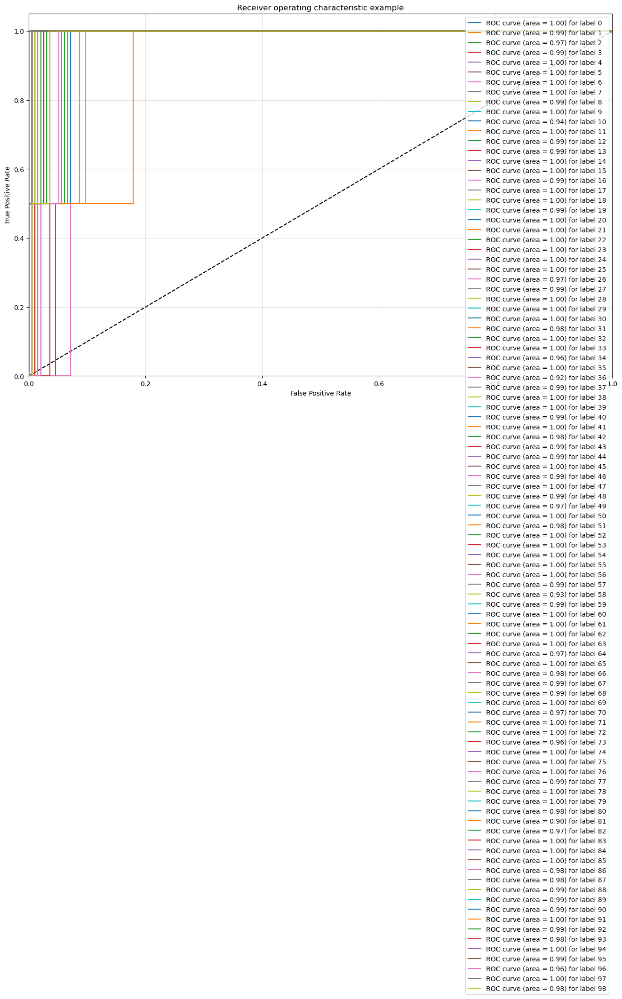

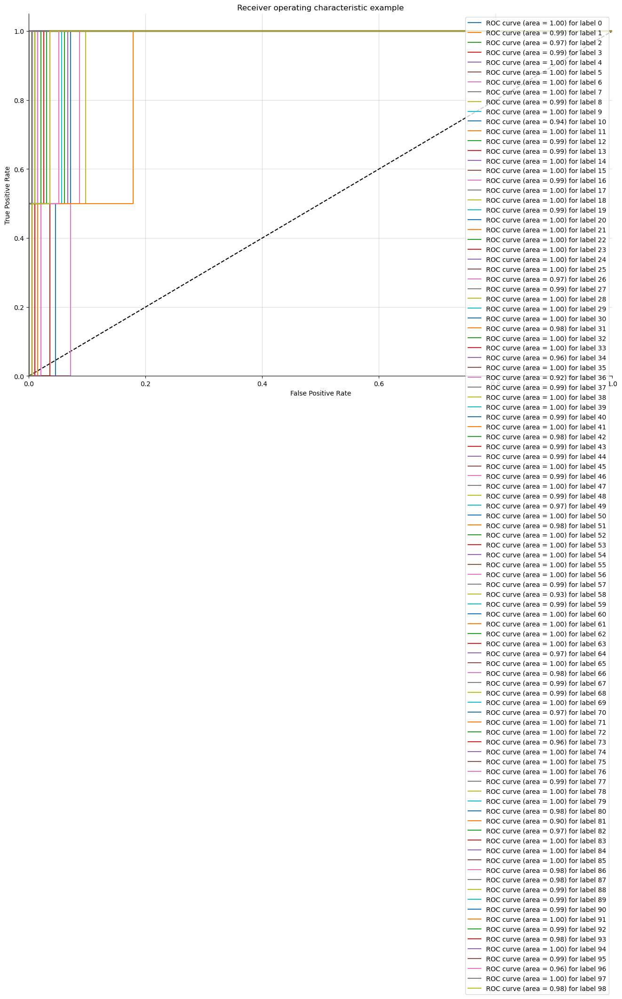

In [193]:
# classifier
clf = OneVsRestClassifier(LogisticRegression())
y_score = clf.fit(X_train, y_train).decision_function(X_test)

def plot_multiclass_roc(clf, X_test, y_test, n_classes, figsize=(17, 6)):
    y_score = clf.decision_function(X_test)

    # structures
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    # calculate dummies once
    y_test_dummies = pd.get_dummies(y_test, drop_first=False).values
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_dummies[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # roc for each class
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot([0, 1], [0, 1], 'k--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic example')
    for i in range(n_classes):
        ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for label %i' % (roc_auc[i], i))
    ax.legend(loc="best")
    ax.grid(alpha=.4)
    sns.despine()
    plt.show()

plot_multiclass_roc(clf, X_test, y_test, n_classes=len(np.unique(y)), figsize=(16, 10))